In [1]:
import pandas as pd
import jos3
import numpy as np
from matplotlib import pyplot as plt

In [2]:
from models.ml_basic import import_data, scale_data, simulate_initial
import joblib

# Load the trained model
model_name = 'ml_ridge_regression'  # Replace with the desired model name
model = joblib.load(f'model_weights/{model_name}.pkl')

# Define the features and output variables
features = ['female', 'age', 'height', 'mass', 'ta_set', 'rh_set', 'previous_tre_int', 'previous_mtsk_int']
output = ['tre_int', 'mtsk_int']

# Create scalers the same as for training
train_df = import_data(features, output)
features_scaler, output_scaler, train_features, train_output = scale_data(train_df, features, output)

# Function to predict tre and mtsk for custom input features
def predict_custom_input(female, age, height, mass, ta_set, rh_set, time_steps=540):
    body_parameters = [female, age, height, mass]
    ambient_conditions = [ta_set, rh_set]
    # Get starting core and skin temp
    initial_body_conditions = simulate_initial(body_parameters, features_scaler, output_scaler, model)
    custom_input = body_parameters + ambient_conditions + initial_body_conditions
    # Simulate for time steps
    predicted_values = []
    for _ in range(time_steps):
        X = np.array(custom_input).reshape(1, -1)
        X = features_scaler.transform(X)
        y = model.predict(X)
        y = output_scaler.inverse_transform(y)
        predicted_values.append(y[0].tolist())
        custom_input[-2:] = y[0].tolist()

    # Get the initial values
    return predicted_values

/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.0.2 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12

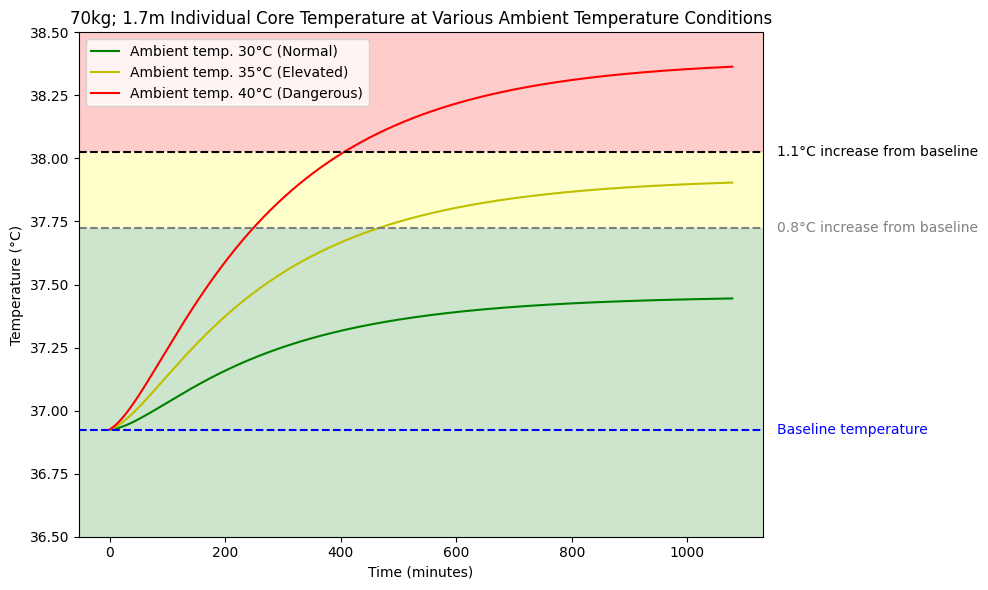

In [7]:
def create_graph():
    fig, ax = plt.subplots(figsize=(10, 6))

    baseline_temp = None

    for t, l, c in [[30, "Ambient temp. 30°C (Normal)", 'g'],
                    [35, "Ambient temp. 35°C (Elevated)", 'y'],
                    [40, "Ambient temp. 40°C (Dangerous)", 'r']]:

        results = predict_custom_input(0, 80, 170, 70, t, 50)
        df = pd.DataFrame(results, columns=['tre_int', 'mtsk_int'])
        df.index = df.index * 2  # Assuming each time step is 2 minutes
        df['TcrPelvis'] = df['tre_int']
        ax.plot(df.index, df.TcrPelvis, label=l, color=c)

        if baseline_temp is None:
            baseline_temp = df.TcrPelvis[0]

    ax.set_ylim(36.5, 38.5)
    ax.set_xlabel("Time (minutes)")
    ax.set_ylabel("Temperature (°C)")
    ax.set_title("70kg; 1.7m Individual Core Temperature at Various Ambient Temperature Conditions")

    # Create shaded regions
    y_min, y_max = ax.get_ylim()
    ax.axhspan(y_min, baseline_temp + 0.8, facecolor='green', alpha=0.2)
    ax.axhspan(baseline_temp + 0.8, baseline_temp + 1.1, facecolor='yellow', alpha=0.2)
    ax.axhspan(baseline_temp + 1.1, y_max, facecolor='red', alpha=0.2)

    # Add horizontal lines with labels on the right
    lines = [
        (baseline_temp, 'blue', 'Baseline temperature'),
        (baseline_temp + 0.8, 'grey', '0.8°C increase from baseline'),
        (baseline_temp + 1.1, 'black', '1.1°C increase from baseline')
    ]

    for y, color, label in lines:
        line = ax.axhline(y=y, color=color, linestyle='--')
        ax.text(1.02, y, label, transform=ax.get_yaxis_transform(), va='center', ha='left', color=color)

    ax.legend()
    plt.tight_layout()
    plt.show()

create_graph()

/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.0.2 when using version 1.4.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
/Users/s5068337/Documents/GitHub/core-temperature-modelling/.venv/lib/python3.12/site-packages/sklear

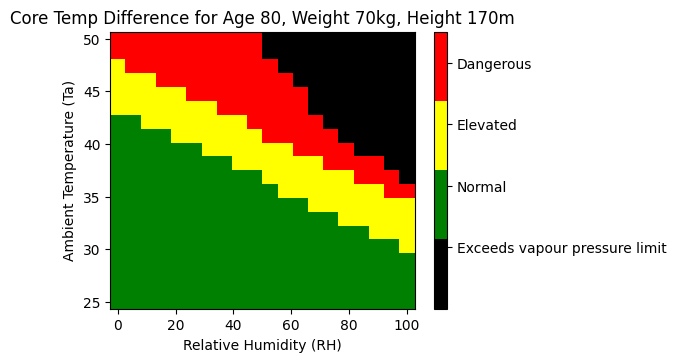

In [14]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.colorbar import ColorbarBase
import joblib
import pandas as pd

# Load the trained model (same as before)
model_name = 'ml_ridge_regression'
model = joblib.load(f'model_weights/{model_name}.pkl')

# Define features and output (same as before)
features = ['female', 'age', 'height', 'mass', 'ta_set', 'rh_set', 'previous_tre_int', 'previous_mtsk_int']
output = ['tre_int', 'mtsk_int']

# Create scalers (same as before)
train_df = import_data(features, output)
features_scaler, output_scaler, train_features, train_output = scale_data(train_df, features, output)

def vapor_pressure(temp_c, relative_humidity):
    # Convert temperature to Kelvin
    temp_k = temp_c + 273.15

    # Calculate saturation vapor pressure (e_s) using the August-Roche-Magnus approximation
    e_s = 0.61094 * math.exp((17.625 * temp_c) / (temp_c + 243.04))

    # Calculate actual vapor pressure (e) by multiplying saturation vapor pressure with relative humidity
    e = e_s * (relative_humidity / 100)
    return e

def get_core_temp_difference(Ta, RH, age, height, weight, time_steps=180):
    if (vapor_pressure(Ta, RH) > 6):
        return np.NaN

    # Use predict_custom_input instead of JOS3
    results = predict_custom_input(0, age, height, weight, Ta, RH, time_steps)
    df = pd.DataFrame(results, columns=['tre_int', 'mtsk_int'])
    start_core_temp = df.tre_int.iloc[0]
    final_core_temp = df.tre_int.iloc[-1]
    return final_core_temp - start_core_temp


# Generate a grid of Ta and RH values (same as before)
Ta_values = np.linspace(25, 50, 20)
RH_values = np.linspace(0, 100, 20)
Ta_grid, RH_grid = np.meshgrid(Ta_values, RH_values)

# Weights and heights (same as before)
weights = [70]
heights = [1.7]

# Vectorize the get_final_temp function to work with 2D arrays
get_core_temp_difference_vectorized = np.vectorize(get_core_temp_difference)

plt.figure(figsize=(16, 10))

# Iterating over weights and heights
for i, weight in enumerate(weights):
    for j, height in enumerate(heights):
        age = 80
        height = 170
        weight = 70
        # Calculate final temperature values for each grid point
        final_temp_grid = get_core_temp_difference_vectorized(Ta_grid, RH_grid, age, height, weight)

        # Apply color conditions
        normal = final_temp_grid < 0.8
        elevated = (final_temp_grid >= 0.8) & (final_temp_grid <= 1.1)
        dangerous = final_temp_grid > 1.1

        # Create a custom colormap with black for NaN values
        colors = ['black', 'green', 'yellow', 'red']
        cmap = ListedColormap(colors)

        # Create an array to store the color indices and set NaN values to -1
        color_indices = np.zeros_like(final_temp_grid) - 1

        # Assign color indices based on the conditions
        color_indices[normal] = 0
        color_indices[elevated] = 1
        color_indices[dangerous] = 2

        # Create subplot for each combination of weight and height
        plt.subplot(3, 3, i * 3 + j + 1)
        plt.pcolormesh(RH_grid, Ta_grid, color_indices, cmap=cmap, shading='auto', norm=Normalize(vmin=-1, vmax=2))
        plt.xlabel("Relative Humidity (RH)")
        plt.ylabel("Ambient Temperature (Ta)")
        plt.title(f"Core Temp Difference for Age {age}, Weight {weight}kg, Height {height}m")

        # Custom colorbar for each subplot (optional, you can comment this out if you want a shared colorbar)
        cax = plt.colorbar(ticks=[-0.33, 0.33, 1, 1.66], orientation='vertical')
        cax.set_ticklabels(['Exceeds vapour pressure limit', 'Normal', 'Elevated', 'Dangerous'])
        plt.clim(-1, 2)

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

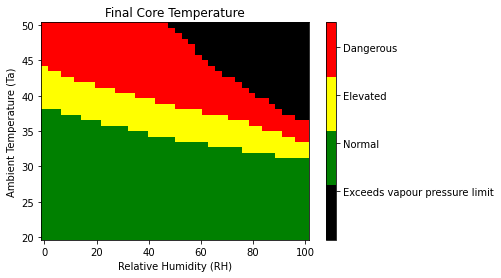

In [13]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.colorbar import ColorbarBase


def vapor_pressure(temp_c, relative_humidity):
    # Convert temperature to Kelvin
    temp_k = temp_c + 273.15

    # Calculate saturation vapor pressure (e_s) using the August-Roche-Magnus approximation
    e_s = 0.61094 * math.exp((17.625 * temp_c) / (temp_c + 243.04))

    # Calculate actual vapor pressure (e) by multiplying saturation vapor pressure with relative humidity
    e = e_s * (relative_humidity / 100)

    return e

def get_final_temp(Ta, RH):
    if (vapor_pressure(Ta, RH) > 6):
        return np.NaN
    model = jos3.JOS3(height=1.7, weight=80, age=70, sex='male')  # Builds a model

    model.Ta = Ta  # Ambient temperature [oC]
    model.RH = RH # Relative humidity [%]
    model.Va = 0.1  # Air velocity [m/s]
    model.PAR = 1.6  # Physical activity ratio [-]
    model.simulate(180)  # Exposre time (minutes)

    df = pd.DataFrame(model.dict_results())  # Make pandas.DataFrame
    final_core_temp = df.TcrPelvis.iloc[-1]
    return final_core_temp

# Generate a grid of Ta and RH values
Ta_values = np.linspace(20, 50, 40)
RH_values = np.linspace(0, 100, 40)
Ta_grid, RH_grid = np.meshgrid(Ta_values, RH_values)

# Vectorize the get_final_temp function to work with 2D arrays
get_final_temp_vectorized = np.vectorize(get_final_temp)

# Calculate final temperature values for each grid point
final_temp_grid = get_final_temp_vectorized(Ta_grid, RH_grid)

# Apply color conditions
normal = final_temp_grid < 37.8
elevated = (final_temp_grid >= 37.8) & (final_temp_grid <= 37.9)
dangerous = final_temp_grid > 37.9

# Create a custom colormap with black for NaN values
colors = ['black', 'green', 'yellow', 'red']
cmap = ListedColormap(colors)

# Create an array to store the color indices and set NaN values to -1
color_indices = np.zeros_like(final_temp_grid) - 1

# Assign color indices based on the conditions
color_indices[normal] = 0
color_indices[elevated] = 1
color_indices[dangerous] = 2

# Plot the graph
plt.figure()
plt.pcolormesh(RH_grid, Ta_grid, color_indices, cmap=cmap, shading='auto', norm=Normalize(vmin=-1, vmax=2))
plt.xlabel("Relative Humidity (RH)")
plt.ylabel("Ambient Temperature (Ta)")
plt.title("Final Core Temperature")

# Create a custom colorbar with labels
cax = plt.colorbar(ticks=[-0.33, 0.33, 1, 1.66], orientation='vertical')
cax.set_ticklabels(['Exceeds vapour pressure limit', 'Normal', 'Elevated', 'Dangerous'])
plt.clim(-1, 2)
plt.show()